In [1]:
import numpy as np
import matplotlib.pyplot as plt
% matplotlib inline
plt.rcParams["figure.dpi"] = 300
np.set_printoptions(precision=3, suppress=True)
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import scale, StandardScaler

# Topic Modelling

In [ ]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

In [ ]:
!tree -Ld 2 data/aclImdb

In [ ]:
from sklearn.datasets import load_files

reviews_train = load_files("data/aclImdb/train/")
# load_files returns a bunch, containing training texts and training labels
text_train, y_train = reviews_train.data, reviews_train.target
print("type of text_train: {}".format(type(text_train)))
print("length of text_train: {}".format(len(text_train)))
print("text_train[1]:\n{}".format(text_train[1]))

In [ ]:
text_train = [doc.replace(b"<br />", b" ") for doc in text_train]

### Topic Modeling and Document Clustering
#### Latent Dirichlet Allocation

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
vect = CountVectorizer(max_features=10000, max_df=.15)
X = vect.fit_transform(text_train)

In [ ]:
from sklearn.decomposition import LatentDirichletAllocation
lda = LatentDirichletAllocation(n_components=10, learning_method="batch",
                                max_iter=25, random_state=0)
# be build the model and transform the data in one step
# computing transform takes some time,
# and we can save time by doing both at once.
document_topics = lda.fit_transform(X)

In [ ]:
print("lda.components_.shape: {}".format(lda.components_.shape))

In [ ]:
# for each topic (a row in the components_), sort the features (ascending).
# Invert rows with [:, ::-1] to make sorting descending
sorting = np.argsort(lda.components_, axis=1)[:, ::-1]
# get the feature names from the vectorizer:
feature_names = np.array(vect.get_feature_names())

In [ ]:
# print out the 10 topics:
mglearn.tools.print_topics(topics=range(10), feature_names=feature_names,
                           sorting=sorting, topics_per_chunk=5, n_words=10)

In [ ]:
lda100 = LatentDirichletAllocation(n_topics=100, learning_method="batch",
                                   max_iter=25, random_state=0)
document_topics100 = lda100.fit_transform(X)

In [ ]:
topics = np.array([7, 16, 24, 25, 28, 36, 37, 41, 45, 51, 53, 54, 63, 89, 97])

In [ ]:
sorting = np.argsort(lda100.components_, axis=1)[:, ::-1]
feature_names = np.array(vect.get_feature_names())
mglearn.tools.print_topics(topics=topics, feature_names=feature_names,
                           sorting=sorting, topics_per_chunk=5, n_words=20)

In [ ]:
# sort by weight of "music" topic 45
music = np.argsort(document_topics100[:, 45])[::-1]
# print the five documents where the topic is most important
for i in music[:10]:
    # pshow first two sentences
    print(b".".join(text_train[i].split(b".")[:2]) + b".\n")

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(10, 10))
topic_names = ["{:>2} ".format(i) + " ".join(words)
               for i, words in enumerate(feature_names[sorting[:, :2]])]
# two column bar chart:
for col in [0, 1]:
    start = col * 50
    end = (col + 1) * 50
    ax[col].barh(np.arange(50), np.sum(document_topics100, axis=0)[start:end])
    ax[col].set_yticks(np.arange(50))
    ax[col].set_yticklabels(topic_names[start:end], ha="left", va="top")
    ax[col].invert_yaxis()
    ax[col].set_xlim(0, 2000)
    yax = ax[col].get_yaxis()
    yax.set_tick_params(pad=130)
plt.tight_layout()

### Exercise
Run NMF, compare results to LDA.
Compare NMF on counts to NMF on tf-idf.
Train LDA on word n-grams (unigram + bigrams for example)

In [2]:
from sklearn.datasets import load_files

reviews_train = load_files("../data/aclImdb/train/")
# load_files returns a bunch, containing training texts and training labels
text_train, y_train = reviews_train.data, reviews_train.target
print("type of text_train: {}".format(type(text_train)))
print("length of text_train: {}".format(len(text_train)))
print("text_train[1]:\n{}".format(text_train[1]))

type of text_train: <class 'list'>
length of text_train: 25000
text_train[1]:
b'Words can\'t describe how bad this movie is. I can\'t explain it by writing only. You have too see it for yourself to get at grip of how horrible a movie really can be. Not that I recommend you to do that. There are so many clich\xc3\xa9s, mistakes (and all other negative things you can imagine) here that will just make you cry. To start with the technical first, there are a LOT of mistakes regarding the airplane. I won\'t list them here, but just mention the coloring of the plane. They didn\'t even manage to show an airliner in the colors of a fictional airline, but instead used a 747 painted in the original Boeing livery. Very bad. The plot is stupid and has been done many times before, only much, much better. There are so many ridiculous moments here that i lost count of it really early. Also, I was on the bad guys\' side all the time in the movie, because the good guys were so stupid. "Executive Decisio

In [3]:
text_train = [doc.replace(b"<br />", b" ") for doc in text_train]

In [4]:
from sklearn.feature_extraction.text import CountVectorizer
vect = CountVectorizer(stop_words="english", min_df=4)
X_train = vect.fit_transform(text_train)

In [5]:
X_train.shape

(25000, 30462)

In [6]:
from sklearn.decomposition import TruncatedSVD
lsa = TruncatedSVD(n_components=100)
X_lsa = lsa.fit_transform(X_train)

In [7]:
lsa.components_.shape

(100, 30462)

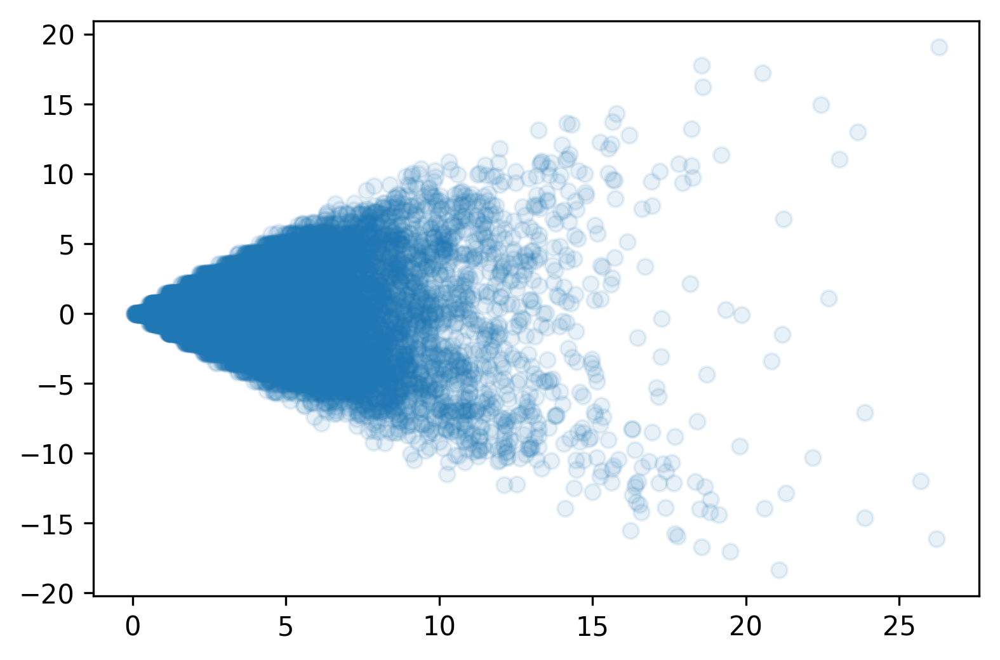

In [8]:
plt.scatter(X_lsa[:, 0], X_lsa[:, 1], alpha=.1)

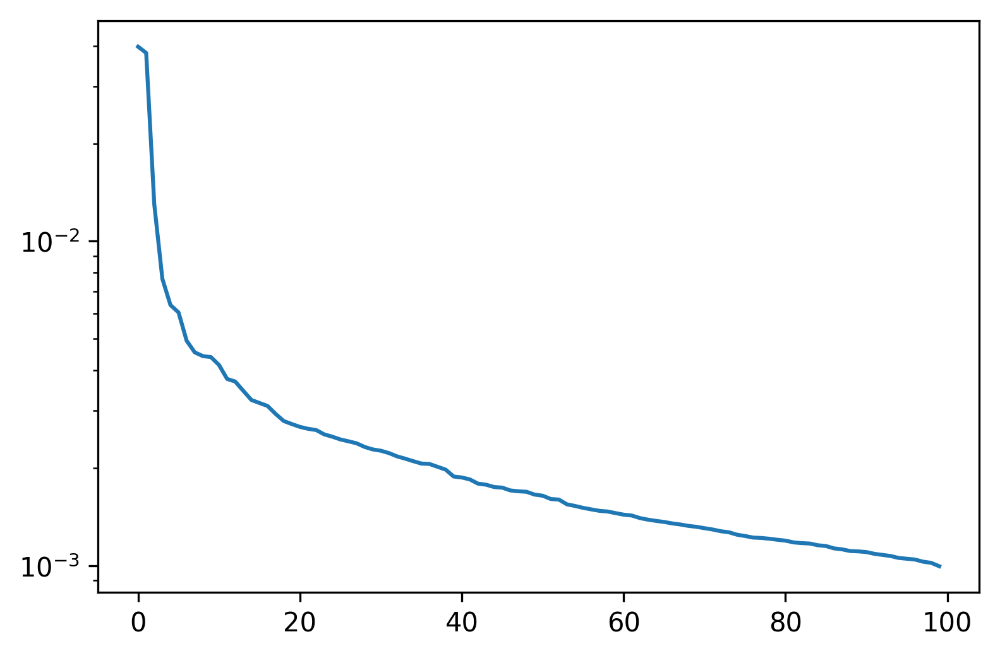

In [9]:
plt.semilogy(lsa.explained_variance_ratio_)

In [10]:
def plot_important_features(coef, feature_names, top_n=20, ax=None):
    if ax is None:
        ax = plt.gca()
    inds = np.argsort(np.abs(coef))[-top_n:]
    important_coefs = coef[inds]
    sort_sign = np.argsort(important_coefs)
    myrange = range(len(inds))
    combined_inds = inds[sort_sign]

    ax.bar(myrange, coef[combined_inds])
    ax.set_xticks(myrange)
    ax.set_xticklabels(feature_names[combined_inds], rotation=60, ha="right")

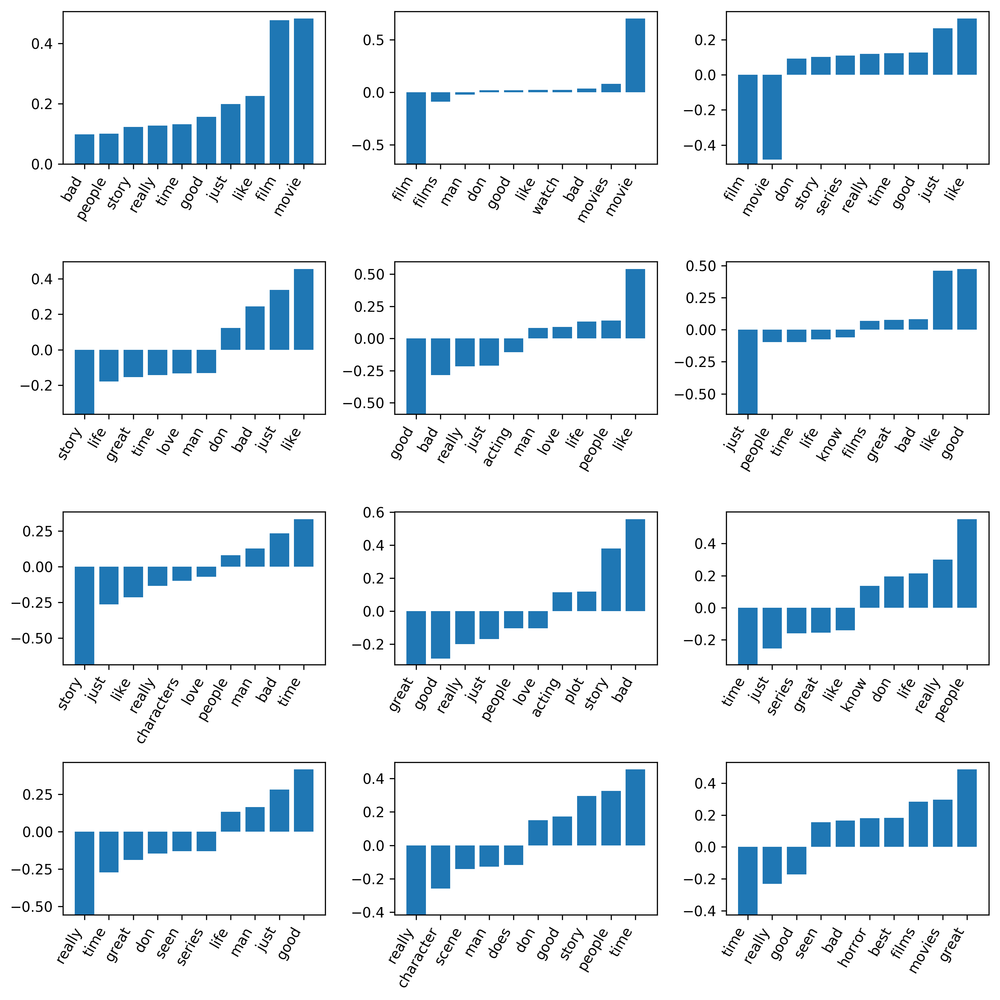

In [11]:
feature_names = np.array(vect.get_feature_names())
n_components = 10
fig, axes = plt.subplots(n_components // 3 + 1, 3, figsize=(10, 10))
for ax, coef in zip(axes.ravel(), lsa.components_):
    plot_important_features(coef, feature_names, top_n=10, ax=ax)
    
plt.tight_layout()

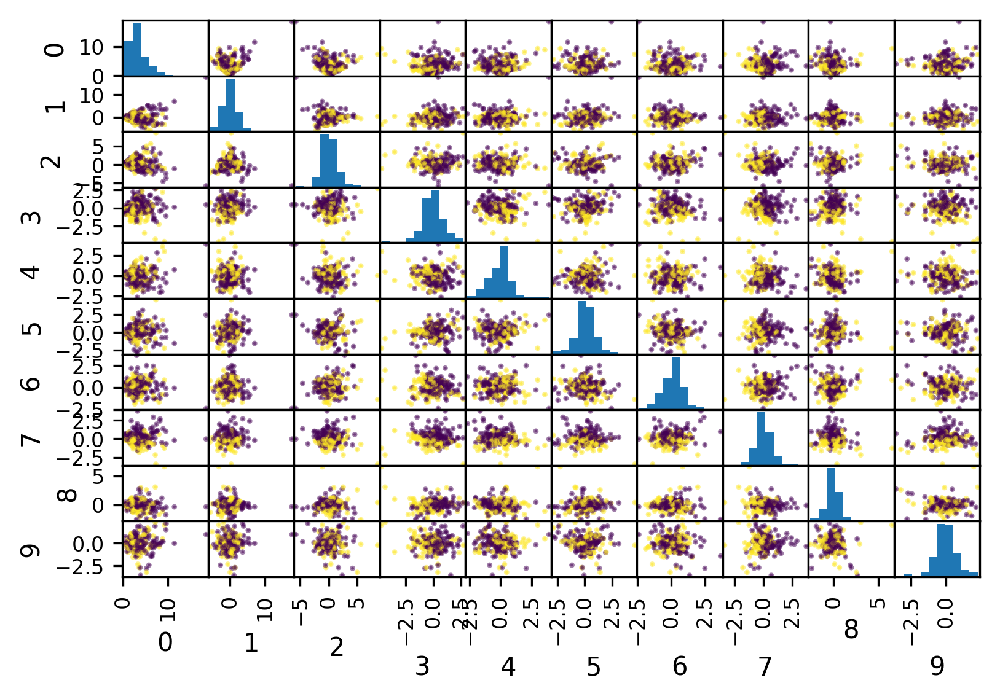

In [12]:
df = pd.DataFrame(X_lsa[::100, :10])
pd.tools.plotting.scatter_matrix(df, c=y_train[::100], s=5);

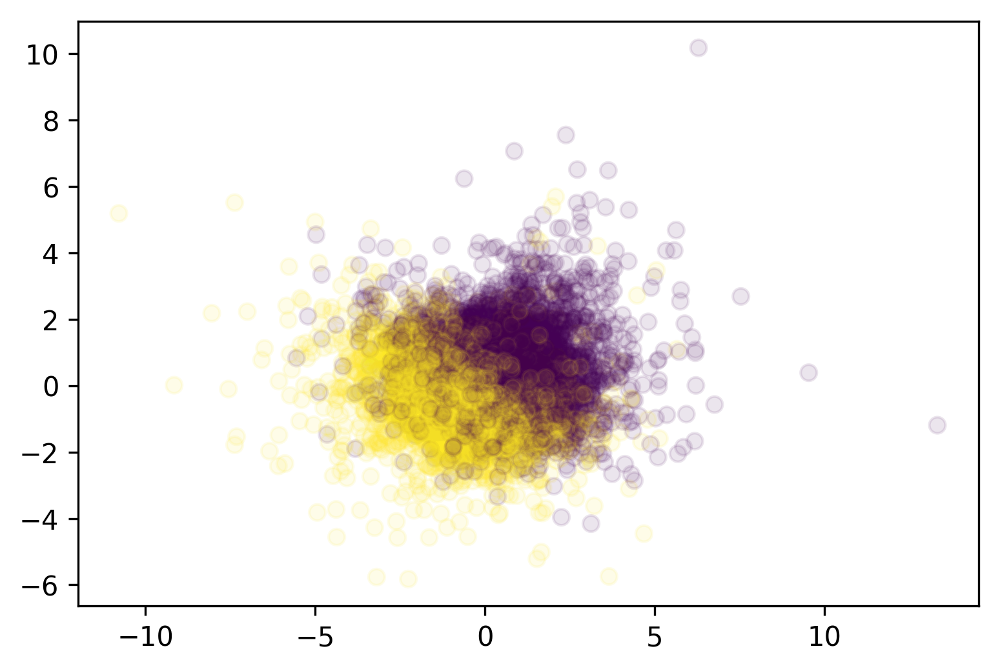

In [13]:
plt.scatter(X_lsa[:, 3], X_lsa[:, 7], alpha=.1, c=y_train)

In [14]:
from sklearn.preprocessing import MaxAbsScaler, Normalizer
scaler = MaxAbsScaler()
X_scaled = scaler.fit_transform(X_train)
X_normalized = Normalizer().fit_transform(X_train)

lsa_normalized = TruncatedSVD(n_components=100)
X_lsa_normalized = lsa_normalized.fit_transform(X_normalized)

/home/andy/checkout/scikit-learn/sklearn/utils/validation.py:431: DataConversionWarning: Data with input dtype int64 was converted to float64 by the normalize function.
  warnings.warn(msg, DataConversionWarning)


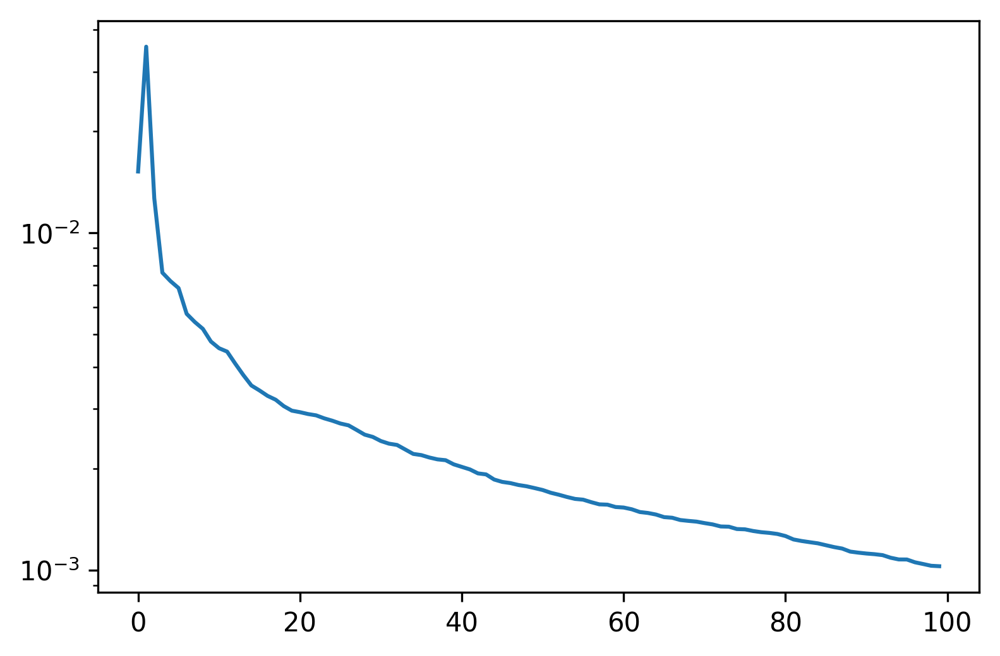

In [15]:
plt.semilogy(lsa_normalized.explained_variance_ratio_)

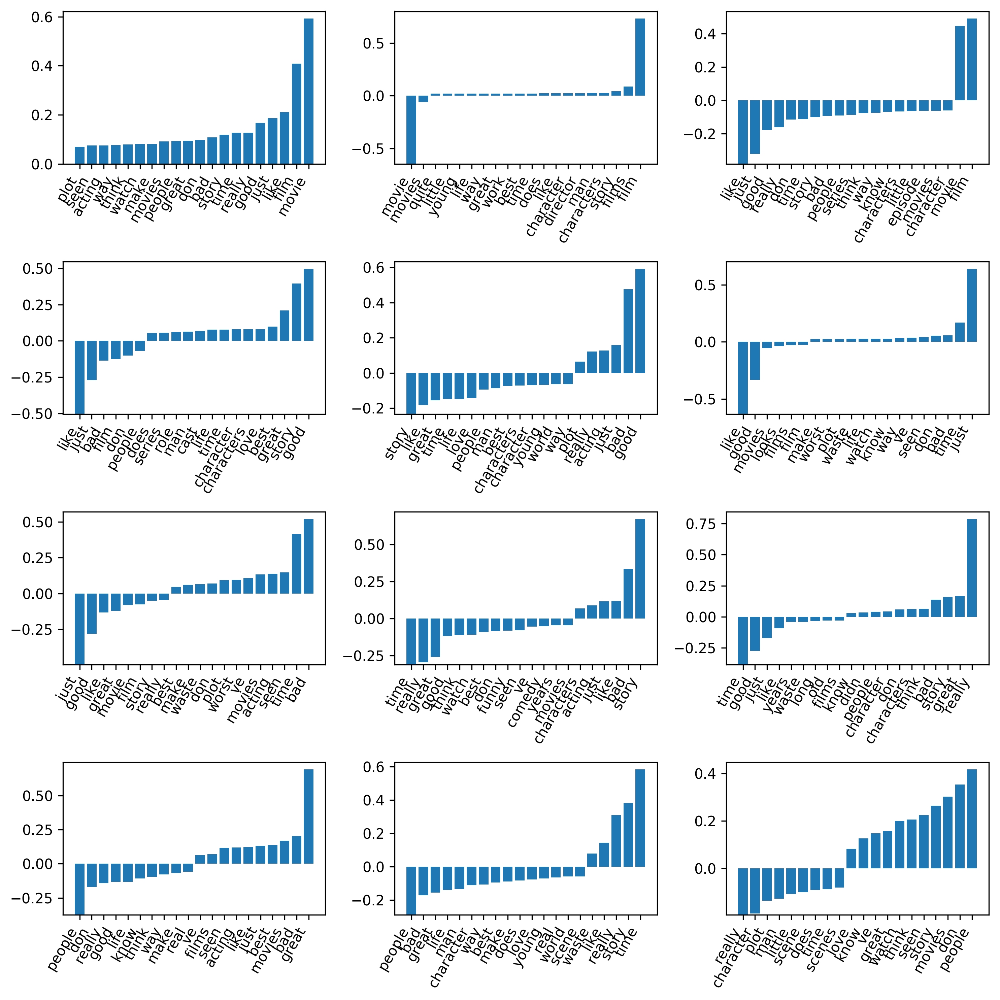

In [16]:
feature_names = np.array(vect.get_feature_names())
n_components = 10
fig, axes = plt.subplots(n_components // 3 + 1, 3, figsize=(10, 10))
for ax, coef in zip(axes.ravel(), lsa_normalized.components_):
    plot_important_features(coef, feature_names, top_n=20, ax=ax)
    
plt.tight_layout()

In [17]:
from sklearn.preprocessing import MaxAbsScaler
scaler = MaxAbsScaler()
X_scaled = scaler.fit_transform(X_train)

lsa_scaled = TruncatedSVD(n_components=100)
X_lsa_scaled = lsa_scaled.fit_transform(X_scaled)

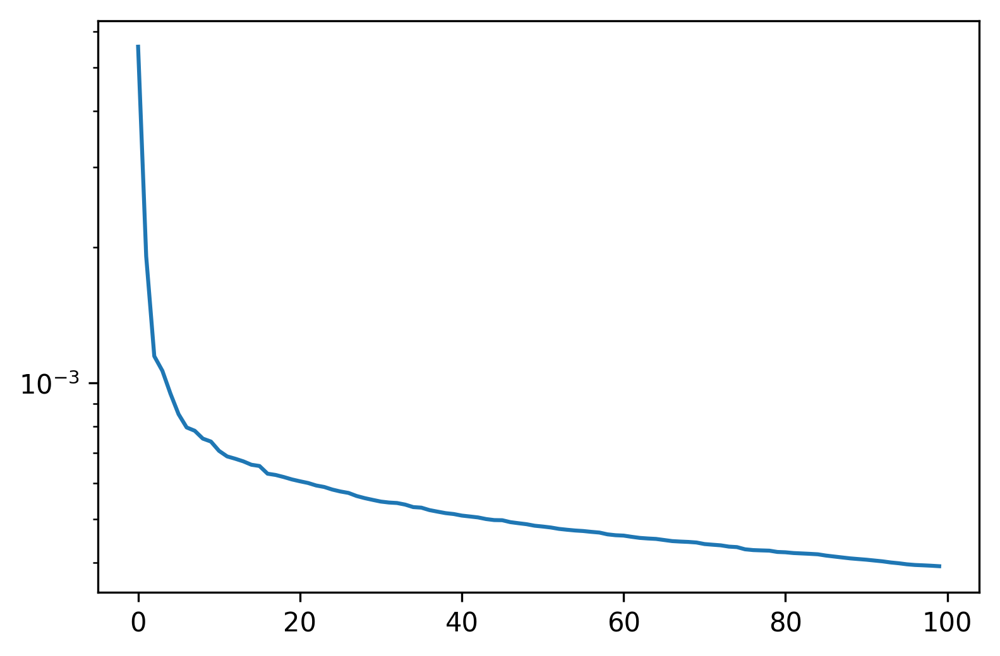

In [18]:
plt.semilogy(lsa_scaled.explained_variance_ratio_)

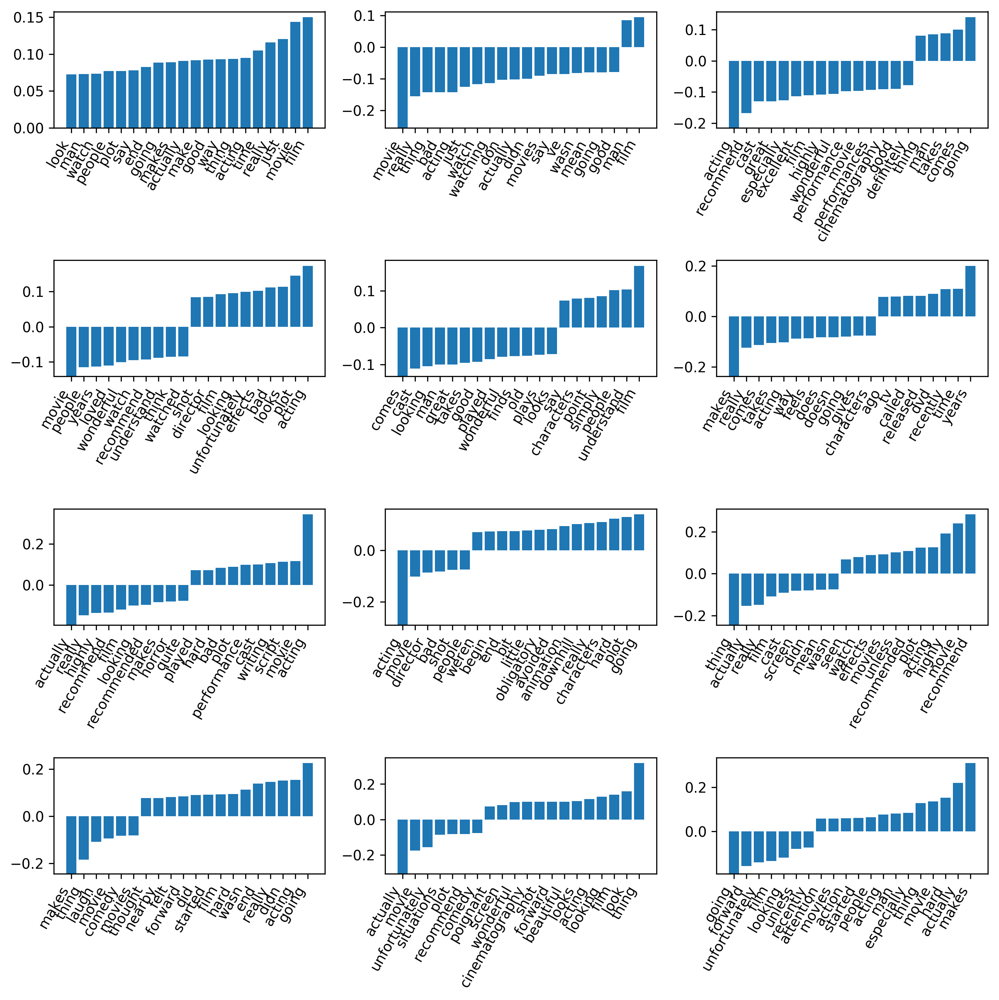

In [19]:
feature_names = np.array(vect.get_feature_names())
n_components = 10
fig, axes = plt.subplots(n_components // 3 + 1, 3, figsize=(10, 10))
for ax, coef in zip(axes.ravel(), lsa_scaled.components_):
    plot_important_features(coef, feature_names, top_n=20, ax=ax)
    
plt.tight_layout()

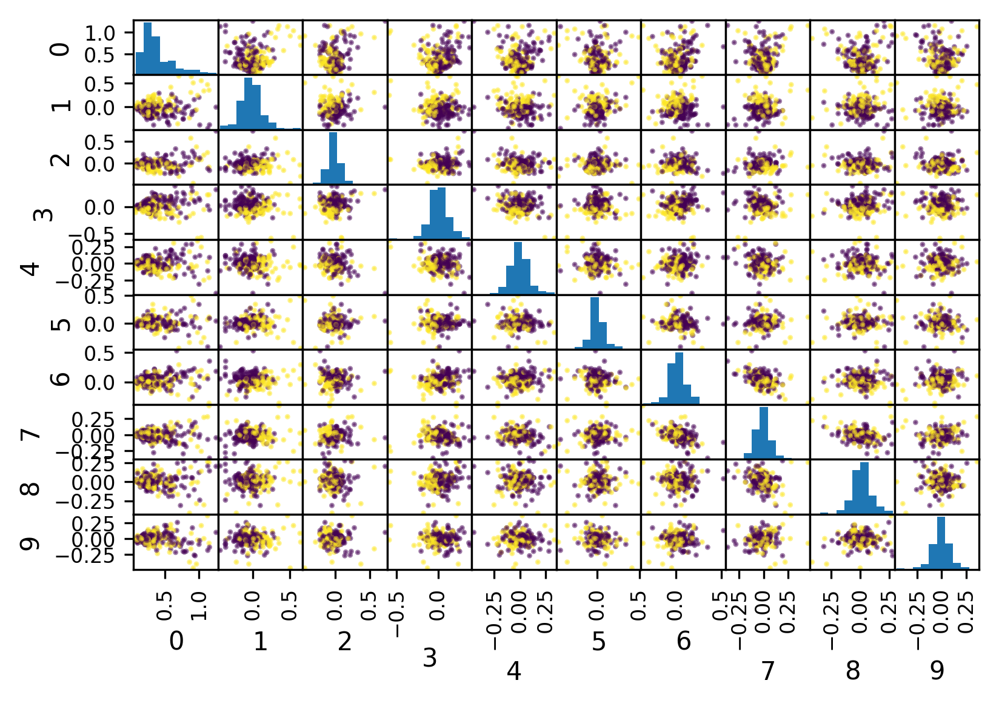

In [20]:
df_scaled = pd.DataFrame(X_lsa_scaled[::100, :10])
pd.tools.plotting.scatter_matrix(df_scaled, c=y_train[::100], s=5);

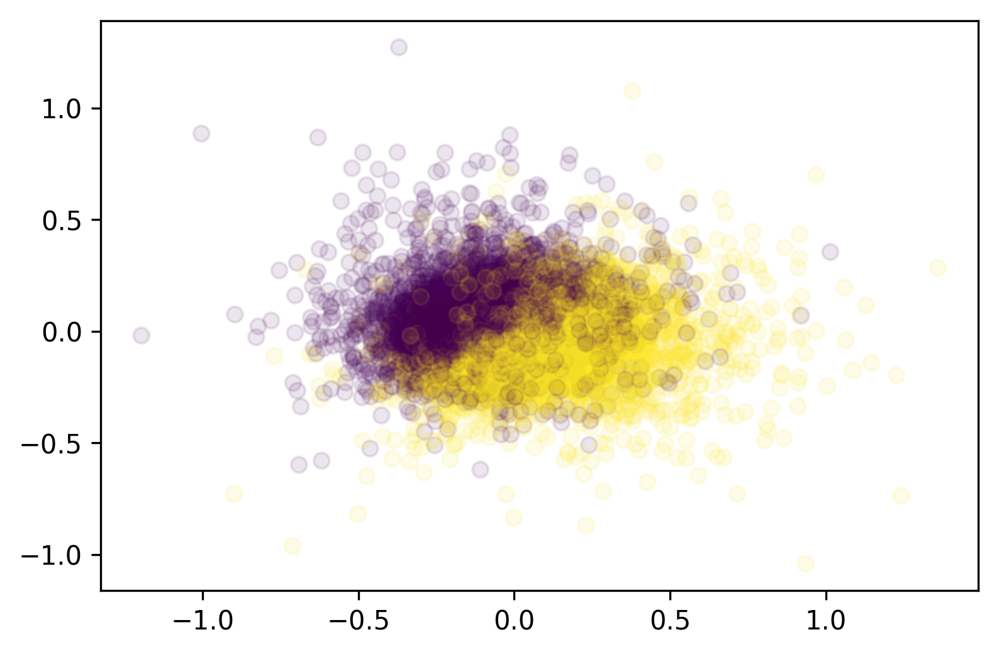

In [21]:
plt.scatter(X_lsa_scaled[:, 1], X_lsa_scaled[:, 3], alpha=.1, c=y_train)

In [22]:
reviews_test = load_files("../data/aclImdb/test/")
text_test, y_test = reviews_test.data, reviews_test.target
text_test = [doc.replace(b"<br />", b" ") for doc in text_test]
X_test = vect.transform(text_test)

In [23]:
X_test_lsa_scaled = lsa_scaled.transform(scaler.transform(X_test))

In [24]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression(C=.1).fit(X_train, y_train)
lr.score(X_test, y_test)

0.87263999999999997

In [25]:
lr_lsa = LogisticRegression(C=100).fit(X_lsa_scaled[:, :10], y_train)
lr_lsa.score(X_test_lsa_scaled[:, :10], y_test)

0.82691999999999999

In [26]:
lr_lsa.score(X_lsa_scaled[:, :10], y_train)

0.82735999999999998

In [27]:
lsa_scaled1k = TruncatedSVD(n_components=1000)
X_lsa_scaled1k = lsa_scaled1k.fit_transform(X_scaled)

In [28]:
X_test_lsa_scaled1k = lsa_scaled1k.transform(scaler.transform(X_test))

In [29]:
lr_lsa = LogisticRegression().fit(X_lsa_scaled1k, y_train)
lr_lsa.score(X_test_lsa_scaled1k, y_test)

0.87383999999999995

In [30]:
lr_lsa.score(X_lsa_scaled1k, y_train)

0.89515999999999996

In [31]:
from sklearn.decomposition import NMF
nmf_scale = NMF(n_components=100, verbose=10, tol=0.01)
nmf_scale.fit(X_scaled)

violation: 1.0
violation: 0.33296760265395164
violation: 0.38287083368324504
violation: 0.3088246239807023
violation: 0.2626982466640347
violation: 0.20625460683115684
violation: 0.1663675468054365
violation: 0.13622329654975787
violation: 0.11122834496333356
violation: 0.09048405145934368
violation: 0.07552806420525776
violation: 0.06523296600888338
violation: 0.05875080043062935
violation: 0.05519194500519219
violation: 0.052932260639934794
violation: 0.05189402263547337
violation: 0.051477831620843434
violation: 0.050533853963775154
violation: 0.04847702040467334
violation: 0.04581469496694178
violation: 0.04277196851873224
violation: 0.03949804044542117
violation: 0.03610769280127263
violation: 0.03274211492990525
violation: 0.029617211858754443
violation: 0.02680959913304586
violation: 0.02439361960869034
violation: 0.022221813793233257
violation: 0.02026871131781975
violation: 0.01849648203162155
violation: 0.017014371513857006
violation: 0.015736388617020355
violation: 0.0146523

NMF(alpha=0.0, beta_loss='frobenius', init=None, l1_ratio=0.0, max_iter=200,
  n_components=100, random_state=None, shuffle=False, solver='cd',
  tol=0.01, verbose=10)

In [32]:
X_nmf_scale = nmf_scale.transform(X_scaled)

violation: 1.0
violation: 0.6376279314277125
violation: 0.05305152680277158
violation: 0.018777835882754973
violation: 0.0044581570690368335
Converged at iteration 5


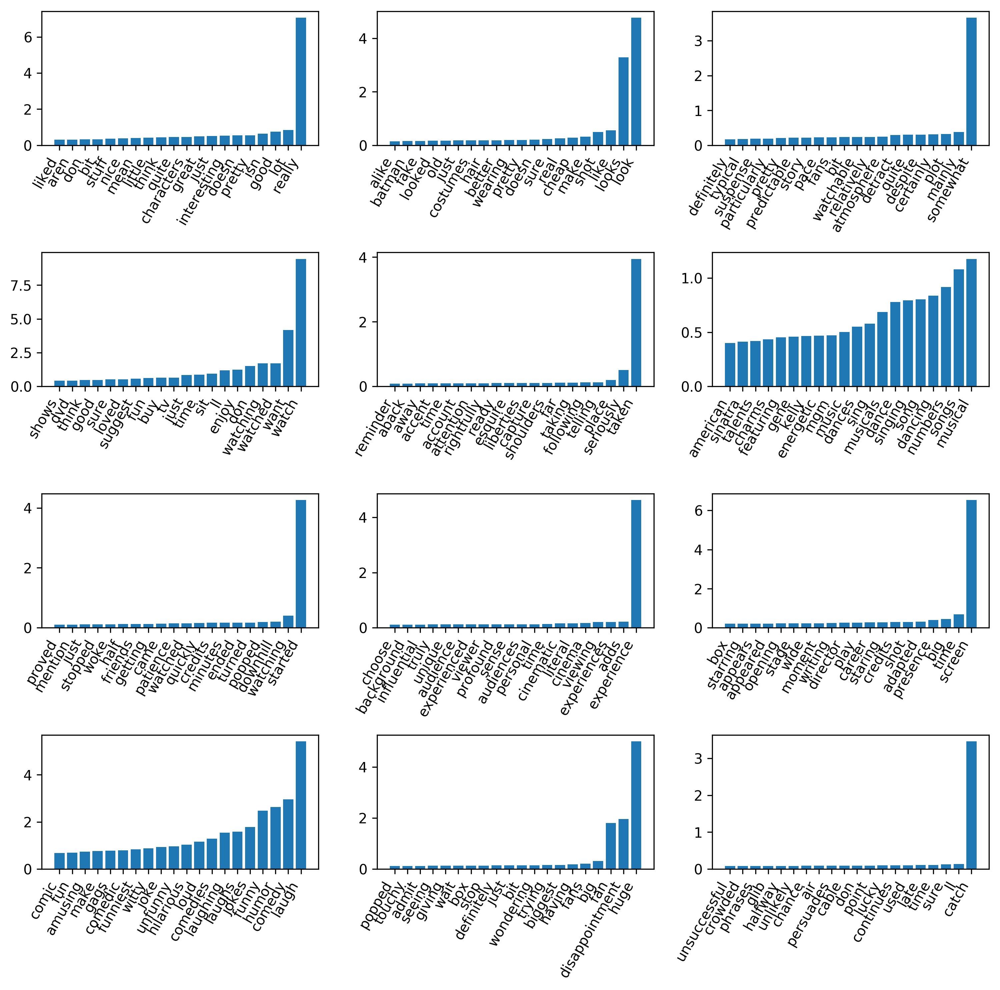

In [33]:
large_comp_inds = np.argsort(X_nmf_scale.mean(axis=0))[-12:][::-1]

feature_names = np.array(vect.get_feature_names())
n_components = 10
fig, axes = plt.subplots(n_components // 3 + 1, 3, figsize=(10, 10))
for ax, coef in zip(axes.ravel(), nmf_scale.components_[large_comp_inds, :]):
    plot_important_features(coef, feature_names, top_n=20, ax=ax)
    
plt.tight_layout()

In [34]:
plt.plot(np.sort(nmf.components_.sum(axis=1)), "o")

NameError: name 'nmf' is not defined

In [ ]:
from sklearn.decomposition import NMF
nmf = NMF(n_components=100, verbose=10, tol=0.01)
X_nm_noscale = nmf.fit_transform(X_train)

In [ ]:
plt.plot(np.sort(nmf.components_.sum(axis=1)), "o")

In [ ]:
large_comp_inds = np.argsort(X_nmf.mean(axis=0))[-12:][::-1]

feature_names = np.array(vect.get_feature_names())
n_components = 10
fig, axes = plt.subplots(n_components // 3 + 1, 3, figsize=(10, 10))
for ax, coef in zip(axes.ravel(), nmf.components_[large_comp_inds, :]):
    plot_important_features(coef, feature_names, top_n=20, ax=ax)
    
plt.tight_layout()

In [ ]:
def print_topics(topics, feature_names, components, topics_per_chunk=6,
                 n_words=20):
    sorting = np.argsort(components, axis=1)[:, ::-1]
    for i in range(0, len(topics), topics_per_chunk):
        # for each chunk:
        these_topics = topics[i: i + topics_per_chunk]
        # maybe we have less than topics_per_chunk left
        len_this_chunk = len(these_topics)
        # print topic headers
        print(("topic {:<8}" * len_this_chunk).format(*these_topics))
        print(("-------- {0:<5}" * len_this_chunk).format(""))
        # print top n_words frequent words
        for i in range(n_words):
            try:
                print(("{:<14}" * len_this_chunk).format(
                    *feature_names[sorting[these_topics, i]]))
            except:
                pass
        print("\n")


In [ ]:
sorting = np.argsort(nmf.components_, axis=1)[:, ::-1]
print_topics(large_comp_inds, feature_names, sorting)

In [ ]:
from sklearn.feature_extraction.text import TfidfTransformer
X_tfidf = TfidfTransformer().fit_transform(X_train)
from sklearn.decomposition import NMF
nmf = NMF(n_components=100, verbose=10, tol=0.01)
X_nmf_tfidf = nmf.fit_transform(X_tfidf)

In [ ]:
large_comp_inds = np.argsort(X_nmf_tfidf.mean(axis=0))[-12:][::-1]

feature_names = np.array(vect.get_feature_names())
n_components = 10
fig, axes = plt.subplots(n_components // 3 + 1, 3, figsize=(10, 10))
for ax, coef in zip(axes.ravel(), nmf.components_[large_comp_inds, :]):
    plot_important_features(coef, feature_names, top_n=20, ax=ax)
    
plt.tight_layout()

In [116]:
from sklearn.feature_extraction.text import TfidfTransformer
X_tfidf = TfidfTransformer().fit_transform(X_train)
from sklearn.decomposition import NMF
nmf10 = NMF(n_components=10, verbose=10, tol=0.001)
X_nmf_tfidf10 = nmf10.fit_transform(X_tfidf)

violation: 1.0
violation: 0.507949233985119
violation: 0.35763731078503747
violation: 0.2704743056512017
violation: 0.2132957886880096
violation: 0.17432320343521257
violation: 0.1452012046290175
violation: 0.12129270735255124
violation: 0.10579575093489832
violation: 0.09542318712322348
violation: 0.08790482284913352
violation: 0.08132335989547378
violation: 0.07445155553959701
violation: 0.06788899226465697
violation: 0.060496480071408426
violation: 0.053818492023960954
violation: 0.04976707817109905
violation: 0.04620296863845753
violation: 0.04347763355642459
violation: 0.04144511668468209
violation: 0.03959942201753751
violation: 0.03784246885139631
violation: 0.03612745702392676
violation: 0.03431747712095447
violation: 0.03251139353836266
violation: 0.030810999771948854
violation: 0.02932768385520031
violation: 0.027978789900532236
violation: 0.02679144450210988
violation: 0.026025815179584178
violation: 0.025412569587795662
violation: 0.024907871839744355
violation: 0.024655569

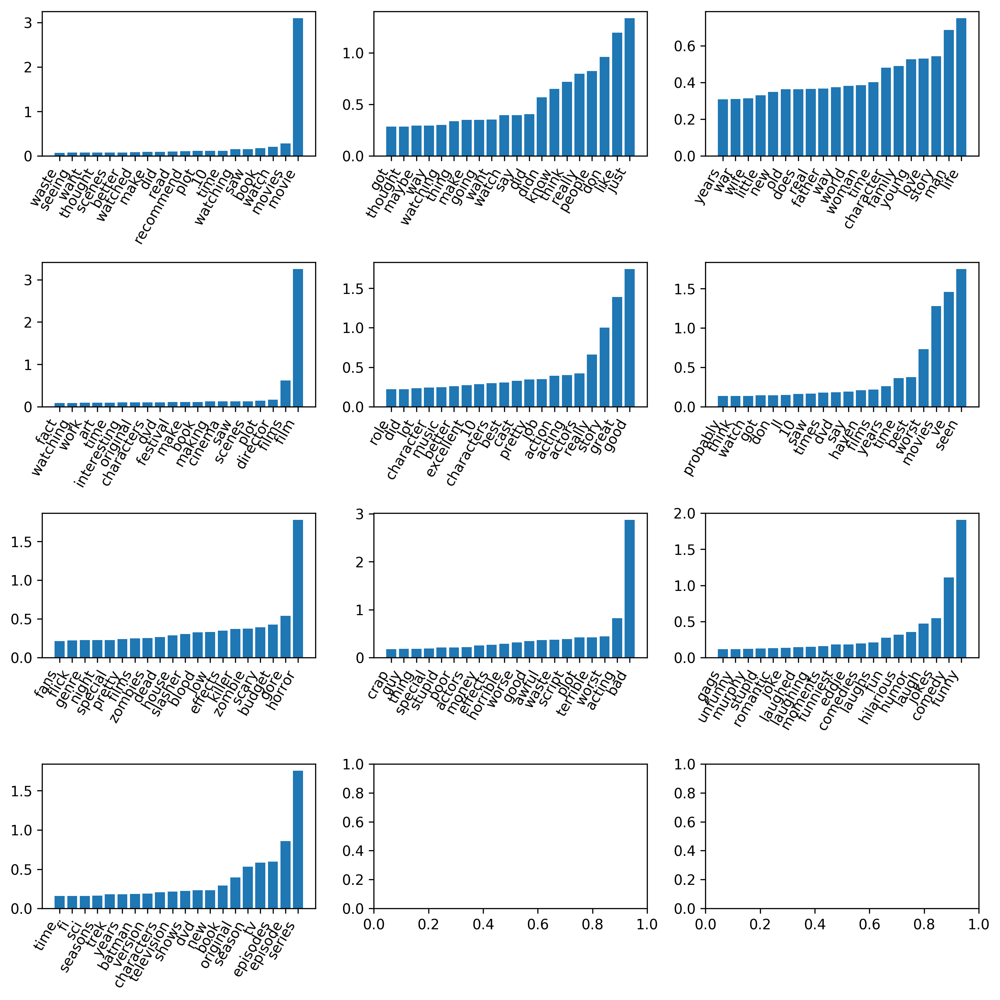

In [117]:
large_comp_inds = np.argsort(X_nmf_tfidf10.mean(axis=0))[-12:][::-1]

feature_names = np.array(vect.get_feature_names())
n_components = 10
fig, axes = plt.subplots(n_components // 3 + 1, 3, figsize=(10, 10))
for ax, coef in zip(axes.ravel(), nmf10.components_[large_comp_inds, :]):
    plot_important_features(coef, feature_names, top_n=20, ax=ax)
    
plt.tight_layout()

In [122]:
from sklearn.decomposition import LatentDirichletAllocation
lda = LatentDirichletAllocation(n_topics=10, learning_method="batch")
X_lda = lda.fit_transform(X_train)

In [123]:
lda.fit(X_train)

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   24.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   24.3s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   21.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   21.2s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   20.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   20.2s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   27.6s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   27.6s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   20.9s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   20.9s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   20.6s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   20.6s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   16.6s remaining:    0.0s
[Parallel(n_jobs=1)]

LatentDirichletAllocation(batch_size=128, doc_topic_prior=None,
             evaluate_every=-1, learning_decay=0.7,
             learning_method='batch', learning_offset=10.0,
             max_doc_update_iter=100, max_iter=10, mean_change_tol=0.001,
             n_jobs=1, n_topics=10, perp_tol=0.1, random_state=None,
             topic_word_prior=None, total_samples=1000000.0, verbose=10)

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   12.8s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   12.8s finished


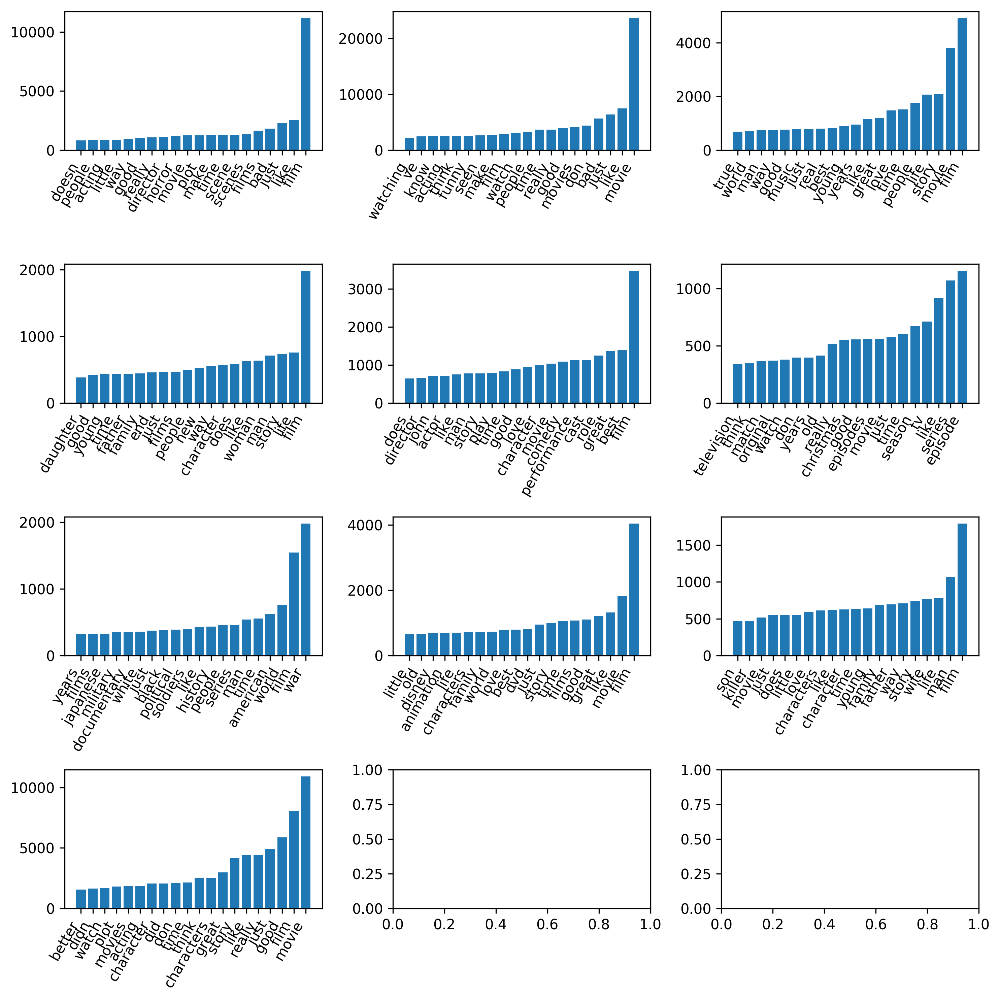

In [125]:
feature_names = np.array(vect.get_feature_names())
n_components = 10
fig, axes = plt.subplots(n_components // 3 + 1, 3, figsize=(10, 10))
for ax, coef in zip(axes.ravel(), lda.components_):
    plot_important_features(coef, feature_names, top_n=20, ax=ax)
    
plt.tight_layout()

In [128]:
lda100 = LatentDirichletAllocation(n_topics=100, learning_method="batch")
X_lda100 = lda100.fit_transform(X_train)

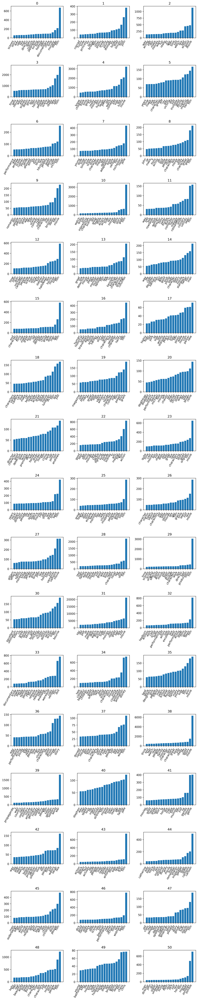

In [136]:
large_comp_inds = np.argsort(X_lda100.mean(axis=0))[-50:][::-1]

feature_names = np.array(vect.get_feature_names())
n_components = 50
fig, axes = plt.subplots(n_components // 3 + 1, 3, figsize=(10, 50))
for i, (ax, coef) in enumerate(zip(axes.ravel(), lda100.components_[:, :])):
    plot_important_features(coef, feature_names, top_n=20, ax=ax)
    ax.set_title(i)
    
plt.tight_layout()

In [142]:
sorting = np.argsort(lda100.components_, axis=1)[:, ::-1]
print_topics(np.argsort(X_lda100.sum(axis=0))[::-1][:30], feature_names, sorting, topics_per_chunk=8)

topic 31      topic 3       topic 38      topic 4       topic 29      topic 57      topic 60      topic 10      
--------      --------      --------      --------      --------      --------      --------      --------      
movie         film          movie         movie         film          series        film          film          
just          just          story         funny         films         episode       horror        good          
like          like          good          like          production    tv            films         story         
bad           really        life          kids          bad           episodes      like          films         
good          bad           really        just          director      season        story         plot          
really        scene         just          comedy        like          good          seen          movie         
don           make          love          watch         work          like          good        

In [139]:
np.argsort(X_lda100.sum(axis=0))

array([72, 51, 17, 49, 83,  1, 81, 59, 11, 98, 44, 76, 55, 20, 68, 71, 90,
       37, 77, 63, 66, 50, 47, 73, 95, 78, 25, 86, 89, 42, 56, 93, 61, 79,
       80, 64, 67, 85, 74, 18, 91,  6, 92, 13, 30, 21, 19, 43, 36, 40,  9,
       96, 16, 27, 97, 14,  7,  5, 54,  8, 26, 35, 87, 41,  0, 84, 58, 52,
       70, 94, 53, 34, 32, 65, 88, 15, 45, 46, 39, 82, 24, 75, 23, 33, 12,
       22, 62, 99, 69,  2, 48, 28, 10, 60, 57, 29,  4, 38,  3, 31])

In [150]:
lda_concentrated = LatentDirichletAllocation(n_topics=10, learning_method="batch", topic_word_prior=1e-5)
X_lda_concentrated = lda_concentrated.fit_transform(X_train)

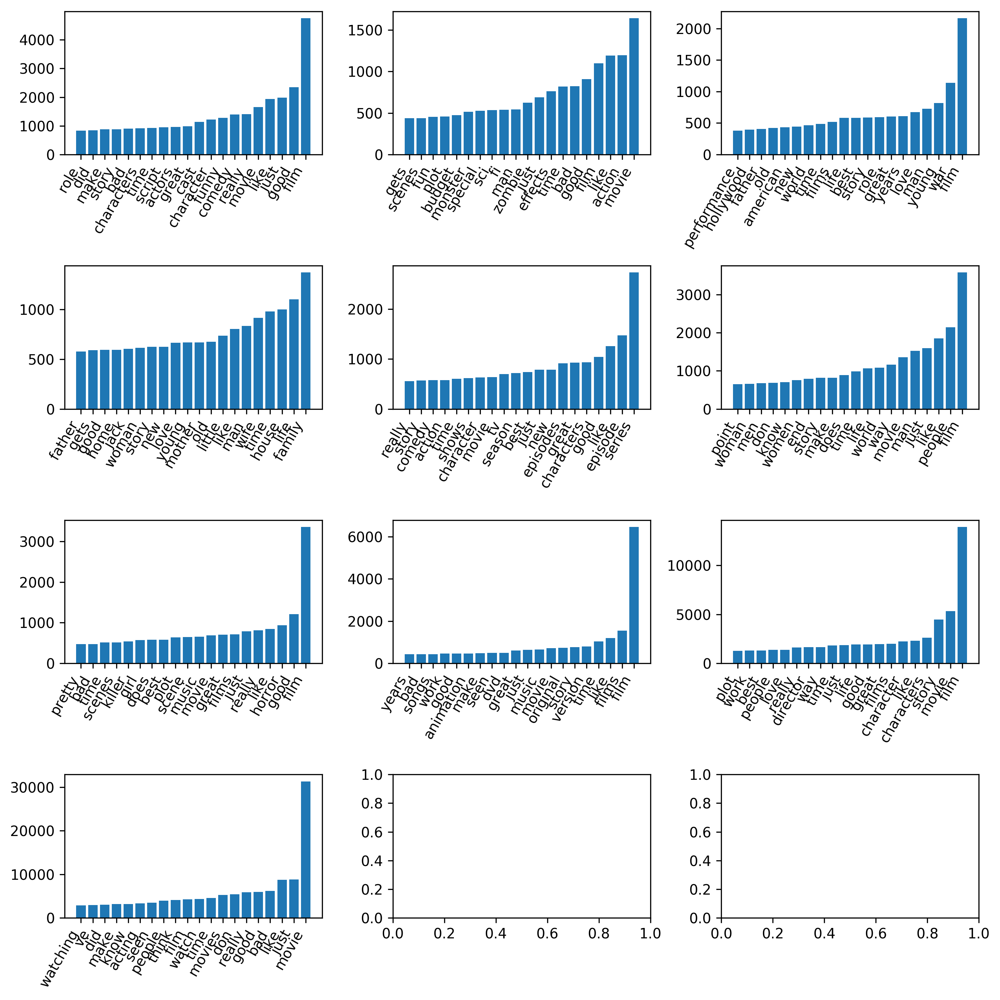

In [151]:
feature_names = np.array(vect.get_feature_names())
n_components = 10
fig, axes = plt.subplots(n_components // 3 + 1, 3, figsize=(10, 10))
for ax, coef in zip(axes.ravel(), lda_concentrated.components_):
    plot_important_features(coef, feature_names, top_n=20, ax=ax)
    
plt.tight_layout()

In [149]:
X_lda_concentrated.sum(axis=0)

array([ 24602.773,     37.173,     37.221,     42.245,     37.58 ,
           42.547,     40.242,     38.623,     40.848,     80.748])